<a href="https://colab.research.google.com/github/nitrogenlab/GP15_watermassanalysis/blob/main/pyompa_0_3_dev.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import cvxpy as cp

In [2]:
!pip install gsw

     |████████████████████████████████| 2.4MB 4.2MB/s 


In [3]:
import gsw

In [4]:
!wget --no-check-certificate 'https://docs.google.com/uc?export=download&id=1Gla6o_YihOCfU5pWGLhFvL-TKm_0aXfQ' -O names_added_GP15OMPA_33RR20180918_only_gs_rosette_clean1_hy1.csv

--2021-05-17 15:47:23--  https://docs.google.com/uc?export=download&id=1Gla6o_YihOCfU5pWGLhFvL-TKm_0aXfQ
Resolving docs.google.com (docs.google.com)... 74.125.204.101, 74.125.204.138, 74.125.204.102, ...
Connecting to docs.google.com (docs.google.com)|74.125.204.101|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://doc-0s-a4-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/6ecov661ovvgklitp6lpvohfnjkgr8kd/1621266375000/06203730782251856755/*/1Gla6o_YihOCfU5pWGLhFvL-TKm_0aXfQ?e=download [following]
--2021-05-17 15:47:24--  https://doc-0s-a4-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/6ecov661ovvgklitp6lpvohfnjkgr8kd/1621266375000/06203730782251856755/*/1Gla6o_YihOCfU5pWGLhFvL-TKm_0aXfQ?e=download
Resolving doc-0s-a4-docs.googleusercontent.com (doc-0s-a4-docs.googleusercontent.com)... 64.233.187.132, 2404:6800:4008:c04::84
Connecting to doc-0s-a4-docs.googleusercontent.com (doc-0s-a4-d

In [5]:
!pip uninstall -y pyompa
%cd /content/
!rm -rf pyompa
!git clone https://github.com/nitrogenlab/pyompa
%cd /content/pyompa
!git checkout v0p3dev
!git log -1
!pip install .
%cd /content/

%reload_ext autoreload
%autoreload 2
from importlib import reload
import pyompa
reload(pyompa)

/content
Cloning into 'pyompa'...
remote: Enumerating objects: 918, done.
remote: Counting objects: 100% (226/226), done.
remote: Compressing objects: 100% (155/155), done.
remote: Total 918 (delta 145), reused 132 (delta 68), pack-reused 692
Receiving objects: 100% (918/918), 14.87 MiB | 14.34 MiB/s, done.
Resolving deltas: 100% (631/631), done.
/content/pyompa
Branch 'v0p3dev' set up to track remote branch 'v0p3dev' from 'origin'.
Switched to a new branch 'v0p3dev'
commit 1fa8ba8c9c1d7400ea2b723249e8de2ba8bc1791 (HEAD -> v0p3dev, origin/v0p3dev)
Author: Av Shrikumar <avanti.shrikumar@gmail.com>
Date:   Mon May 17 08:42:50 2021 -0700

    version bump
Processing /content/pyompa
  Created wheel for pyompa: filename=pyompa-0.3.2.0-cp37-none-any.whl size=18976 sha256=371dc38bea664d72dfcd3f58c39e99db17a17836843e640d396a802f91e0a506
  Stored in directory: /tmp/pip-ephem-wheel-cache-5d6q0le0/wheels/c8/e7/18/86bb9113ba57075c1244f892ac172edfebb6b9de263279873f
Successfully built pyompa
/conten

<module 'pyompa' from '/usr/local/lib/python3.7/dist-packages/pyompa/__init__.py'>

In [6]:
import pandas as pd
import numpy as np

def augment_df_with_PO_NO_SiO(df):  
  #remineralization ratios
  r_PO = 155;
  r_SiO = 15
  r_NO = 9.68
  df["PO"] = df["oxygen"] + df["phosphate"]*r_PO
  df["NO"] = df["oxygen"] + df["nitrate"]*r_NO
  df["SiO"] = df["oxygen"] + df["silicate"]*r_SiO

header = ["c"+str(i) for i in range(1,30)]
header[4] = "bottle flag"
header[16] = "bottle salinity flag"
header[20] = "bottle oxygen flag"
header[22] = "silicate flag"
header[24] = "nitrate flag"
header[28] = "phosphate flag"

header[11] = "CTD pressure"
header[12] = "CTD temperature"
header[15] = "practical_salinity" #practical salinity
header[8] = "lat"
header[9] = "lon"

header[0] = "stnnbr"
header[5] = "geotrc_ID"
header[10] = "bottom depth"
header[19] = "oxygen"
header[21] = "silicate"
header[23] = "nitrate"
header[27] = "phosphate"

gp15_df = pd.read_csv("names_added_GP15OMPA_33RR20180918_only_gs_rosette_clean1_hy1.csv",
                      names=header, na_values = -999)

#remove bad data
for flag_type in ["bottle flag", "bottle salinity flag", "bottle oxygen flag",
                  "silicate flag", "nitrate flag", "phosphate flag"]:
    gp15_df = gp15_df[gp15_df[flag_type] <= 2]
gp15_df = pd.DataFrame(gp15_df)

#create PO offset
#gp15_df["phosphate"] = gp15_df["phosphate"] - 0.2

#add PO and NO to data frame
augment_df_with_PO_NO_SiO(gp15_df)

absolute_salinity = gsw.SA_from_SP(SP=gp15_df["practical_salinity"],
                                   p=gp15_df["CTD pressure"],
                                   lon=gp15_df["lon"],
                                   lat=gp15_df["lat"])
gp15_df["absolute_salinity"] = absolute_salinity

conservative_temp = gsw.CT_from_t(SA=absolute_salinity,
                                  t=gp15_df["CTD temperature"],
                                  p=gp15_df["CTD pressure"])
gp15_df["conservative_temp"] = conservative_temp

potential_temp = gsw.pt_from_CT(SA=absolute_salinity,
                                CT=conservative_temp)
gp15_df["potential_temp"] = potential_temp

sig0 = gsw.rho(SA=absolute_salinity, CT=conservative_temp, p=0) - 1000
gp15_df["sigma0"] = sig0

z = gsw.z_from_p(p=gp15_df["CTD pressure"], lat=gp15_df["lat"])
depth = -z #https://github.com/TEOS-10/python-gsw/blob/7d6ebe8114c5d8b4a64268d36100a70e226afaf6/gsw/gibbs/conversions.py#L577
gp15_df["Depth"] = depth

spic0 = gsw.spiciness0(SA=absolute_salinity, CT=conservative_temp)
gp15_df["spiciness"] = spic0

#calculation of planetary vorticity
rho_ref = 1000.0 #reference density
Omega = 2*np.pi/86400;
f = np.mean(2*Omega*np.sin(gp15_df["lat"]*(np.pi/180.0)))
PV = -(f/rho_ref)*(np.gradient(sig0, depth))
gp15_df["PV"] = PV #potential vorticity

print("Rows:",len(gp15_df))
gp15_df = gp15_df.dropna()
print("Rows without NA values:",len(gp15_df))

Rows: 940
Rows without NA values: 926


/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:1072: RuntimeWarning: divide by zero encountered in true_divide
  a = -(dx2)/(dx1 * (dx1 + dx2))
/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:1073: RuntimeWarning: divide by zero encountered in true_divide
  b = (dx2 - dx1) / (dx1 * dx2)
/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:1074: RuntimeWarning: divide by zero encountered in true_divide
  c = dx1 / (dx2 * (dx1 + dx2))
/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:1080: RuntimeWarning: invalid value encountered in add
  out[tuple(slice1)] = a * f[tuple(slice2)] + b * f[tuple(slice3)] + c * f[tuple(slice4)]


In [7]:
def prepare_endmember_df(endmembers_arr):
    df = pd.DataFrame(data=endmembers_arr,
                      columns=["endmember_name",
                               "potential_temp", "practical_salinity",
                               "oxygen", "phosphate", "silicate",
                               "nitrate", "spiciness", "PV"])
    augment_df_with_PO_NO_SiO(df)
    return df

                             #Temp  Sal     Oxy     Phos   Sili   Nitr    Spic      Vort
P16_Emilie_AAIW = ["AAIW",    5.68, 34.307, 237.0,  1.77,  16.60, 25.5,   0.068,    88.86E-12]
PSUW =            ["PSUW",    4.03, 33.38,	174.7,	2.35,  59.34, 31.24,  -0.964,  970.78E-12]
GLODAP_ESSW =     ["ESSW",   12.2,  34.86,  84.6,   1.87,  21.58, 25.87,   1.419,    2.66E-12]
GLODAP_mystery =  ["Mystery", 2.09, 34.53,   36.1,  3.03, 168.87, 43.5,  -0.154,    26.95E-12]
GLODAP_EqPIW =    ["EqPIW",   7.65, 34.60,   48.50, 2.71,  44.53, 38.26,  0.568,     0.01E-12]
GLODAP_NPIW =     ["NPIW",    4.72, 34,      81.8,  2.64,  79.87, 36.48, -0.262,   130.26E-12]
PDW1 =            ["PDW1",    1.78, 34.59,   59.60, 2.92, 166.62, 41.38, -0.140,    19.14E-12]
P16_UCDW =        ["UCDW",    2.6,  34.575, 168,    2.4,   85.7,  34.4,  -0.1,      37.49E-12]
PDW23 =           ["PDW23",   1.23, 34.67,  128.50, 2.62, 164.89, 37.24, -0.182,     6.05E-12]
P16_LCDW =        ["LCDW",    1.62, 34.738, 195,    2.17,  96.6,  31,    -0.066,    12.55E-12]
GLODAP_AABW =     ["AABW",    0.18, 34.70,  219,    2.27, 124.45, 32.57, -0.203,     2.90E-12]


In [8]:
import pyompa
reload(pyompa)
from pyompa import OMPAProblem, EndMemExpPenaltyFunc
from collections import OrderedDict

#gp15_intermediate = gp15_df[(gp15_df["sigma0"] >= 26.6)
#                            & (gp15_df["sigma0"] <= 27.72)]

gp15_intermediateanddeep = pd.DataFrame(gp15_df[(gp15_df["sigma0"] >= 26.6)])

#intermediate_paramsandweighting_nospicy = ([("potential_temp",140),
#                                            ("practical_salinity",100),
#                                            ("silicate",30),
#                                            ("NO",10),
#                                            #("PO",10),
#                                            #("spiciness",10),
#                                            #("PV",10),
#                                           ], [])

#default redfield: C:N:P:O = 106:16:1:-155
#Teng et al says C:P is in the range 66 to 209
#Assuming relative ratios of other things stay the same, then -O/P goes from
# -155*(66/106) to -155*(209/106)
conversionratios_flexible = {
    "oxygen": [-1,-1],
    "nitrate": [1.0/9.68, 1.0/9.68],
    "phosphate": [1.0/(155.0*(66.0/106.0)), 1.0/(155.0*(209.0/106.0))],
}

conversionratios_static = {
    "oxygen": [-1],
    "nitrate": [1.0/9.68],
    "phosphate": [1.0/155.0],
}

rian_weighting_withconversion = (
 [("potential_temp",56.0), ("practical_salinity",80.0),("silicate",3.0)],
 [("nitrate", 5.0), ("phosphate", 5.0), ("oxygen", 1.0)])

rian_weighting_noconversion = (
 [("potential_temp",56.0), ("practical_salinity",80.0),
  ("silicate",3.0), ("NO",1.0),("PO",0.5)], [])

endmemberdfname_to_dfs = OrderedDict()  

endmember_usagepenalty = {
    PSUW[0]: EndMemExpPenaltyFunc(
        spec={'lat': {'type':'latlon_default', 'lowerbound':10}}),
    P16_LCDW[0]: EndMemExpPenaltyFunc(
        spec={'sigma0': {'type':'density_default', 'lowerbound':27.72}}),
    GLODAP_AABW[0]: EndMemExpPenaltyFunc(
        spec={'sigma0': {'type':'density_default', 'lowerbound':27.72}})
}

endmemberdfname_to_dfs['intermediateanddeep_withpenalty_flexibleconversion'] =\
  (prepare_endmember_df([P16_Emilie_AAIW,
                          PSUW,
                          GLODAP_ESSW,
                          GLODAP_NPIW,
                          PDW1,
                          P16_UCDW,
                          PDW23,
                          P16_LCDW,
                          GLODAP_AABW
                          ]),
   gp15_intermediateanddeep,
   endmember_usagepenalty,
   conversionratios_flexible)
  
#endmemberdfname_to_dfs['intermediateanddeep_withpenalty_staticconversion'] =\
#  (prepare_endmember_df([P16_Emilie_AAIW,
#                          PSUW,
#                          GLODAP_ESSW,
#                          GLODAP_NPIW,
#                          PDW1,
#                          P16_UCDW,
#                          PDW23,
#                          P16_LCDW,
#                          GLODAP_AABW
#                          ]),
#   gp15_intermediateanddeep,
#   watermass_usagepenalty,
#   conversionratios_static)


ompa_setting_to_soln = OrderedDict()
for endmemberdfname, (endmember_df, obs_df, usagepenalty, conversionratios)\
  in endmemberdfname_to_dfs.items():
    for (weightingname, (weighting_conserved, weighting_converted)) in [
             ("rian_weighting_withconversion", rian_weighting_withconversion),
             #("rian_weighting_noconversion", rian_weighting_noconversion),
             ]:
        for smoothness_lambda in [None]:#, 10000]:#, 100000, 1000000]:
            print(endmemberdfname, weightingname)
            ompa_soln = OMPAProblem(
              obs_df = obs_df,
              paramsandweighting_conserved=weighting_conserved,
              paramsandweighting_converted=weighting_converted,
              conversionratios=conversionratios,
              smoothness_lambda=smoothness_lambda,
              endmembername_to_usagepenaltyfunc=usagepenalty).solve(
                  endmember_df,
                  endmember_name_column="endmember_name")
            ompa_setting_to_soln[(endmemberdfname,
                                  smoothness_lambda,
                                  weightingname)] = ompa_soln


intermediateanddeep_withpenalty_flexibleconversion rian_weighting_withconversion
Adding penalty for PSUW
Adding penalty for LCDW
Adding penalty for AABW
params to use: ['potential_temp', 'practical_salinity', 'silicate'] ['nitrate', 'phosphate', 'oxygen']
param weighting: [56. 80.  3.  5.  5.  1.]
Conversion ratios:
[[ 0.10330579  0.01036168 -1.        ]
 [ 0.10330579  0.00327211 -1.        ]]
status: optimal
optimal value 25237.191131923202
Original weighted sum squares: 25218.581870400514
Post fix weighted sum squared: 25218.85917846045
status: optimal
optimal value 872370.283651448
Original weighted sum squares: 872352.8271012004
Post fix weighted sum squared: 872352.8275728378
status: optimal
optimal value 22488.94813901907
Original weighted sum squares: 22468.94044910057
Post fix weighted sum squared: 22469.067440901326
objective: 22469.06744090133


Plotting endmember fractions
Setting: ('intermediateanddeep_withpenalty_flexibleconversion', None, 'rian_weighting_withconversion')


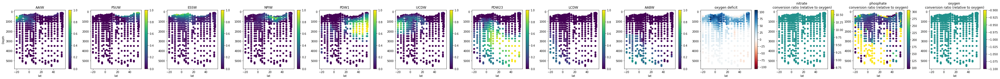

Plotting absolute residuals
Setting: ('intermediateanddeep_withpenalty_flexibleconversion', None, 'rian_weighting_withconversion')


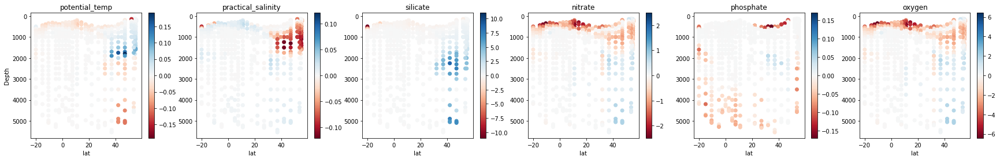

In [9]:
from matplotlib import pyplot as plt
from pyompa import (plot_ompasoln_endmember_fractions,                       
                    plot_ompasoln_residuals,                                 
                    plot_ompasoln_endmember_usagepenalties)


print("Plotting endmember fractions")
for setting in ompa_setting_to_soln:
    print("Setting:", setting)
    ompa_soln = ompa_setting_to_soln[setting]
    plot_ompasoln_endmember_fractions(ompa_soln=ompa_soln,
                                      xaxis_colname="lat",
                                      yaxis_colname="Depth")


print("Plotting absolute residuals")
for setting in ompa_setting_to_soln:
    print("Setting:", setting)
    ompa_soln = ompa_setting_to_soln[setting]
    plot_ompasoln_residuals(ompa_soln=ompa_soln,
                            xaxis_colname="lat",
                            yaxis_colname="Depth")

In [10]:
#Compute ideal water masses for the given water mass fractions
ompa_soln = ompa_setting_to_soln[
  ('intermediateanddeep_withpenalty_flexibleconversion',
   None, 'rian_weighting_withconversion')]

ompa_solns = ompa_soln.iteratively_refine_ompa_soln(num_iterations=10)


Constructing ideal end members
status: optimal
optimal value 11601.418005720612
Old weighted residuals sumsquared: 22469.067440901355
New weighted residuals sumsquared: 11601.418005720509
On iteration 1
params to use: ['potential_temp', 'practical_salinity', 'silicate'] ['nitrate', 'phosphate', 'oxygen']
param weighting: [56. 80.  3.  5.  5.  1.]
Conversion ratios:
[[ 0.10330579  0.01036168 -1.        ]
 [ 0.10330579  0.00327211 -1.        ]]
status: optimal
optimal value 11202.398154796927
Original weighted sum squares: 11160.75469477427
Post fix weighted sum squared: 11160.762422248361
status: optimal
optimal value 858819.5919604262
Original weighted sum squares: 858786.796101026
Post fix weighted sum squared: 858786.8226404827
status: optimal
optimal value 8667.710558961753
Original weighted sum squares: 8625.961297622564
Post fix weighted sum squared: 8625.986332988165
objective: 8625.986332988163
On iteration 2
Constructing ideal end members
status: optimal
optimal value 6913.7743

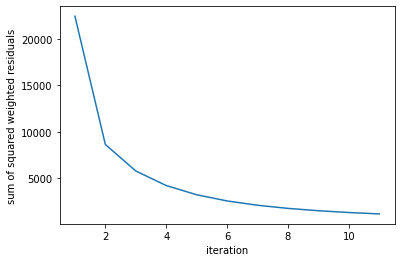

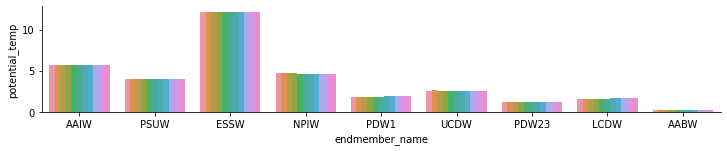

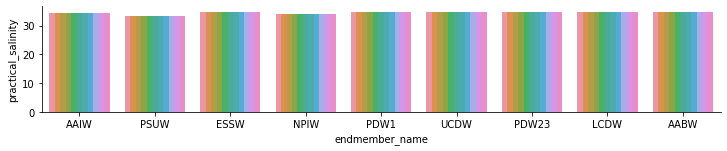

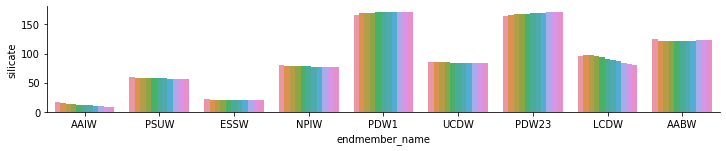

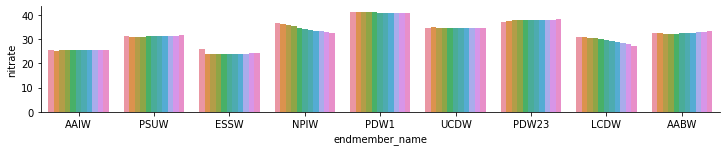

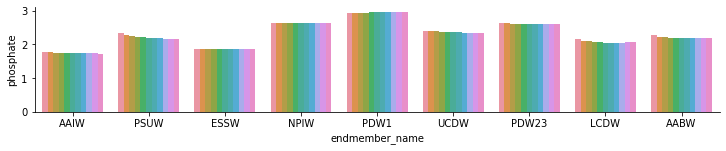

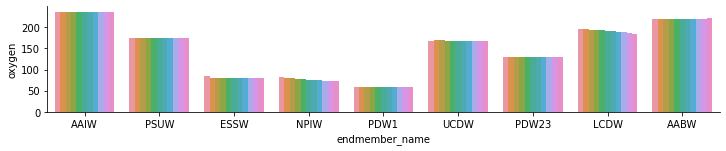

In [11]:
from matplotlib import pyplot as plt

plt.plot(np.arange(len(ompa_solns))+1,
         [x.resid_wsumsq for x in ompa_solns])
plt.xlabel("iteration")
plt.ylabel("sum of squared weighted residuals")
plt.show()

for iteridx, ompa_soln in enumerate(ompa_solns):
    ompa_soln.endmember_df["iteration"] = iteridx
for_plot_wmdf = pd.concat([x.endmember_df for x in ompa_solns])

params_to_use = ompa_soln.conserved_params_to_use+ompa_soln.converted_params_to_use
import seaborn as sns
for param in params_to_use:
  sns.catplot(x="endmember_name",
              y=param,
              hue="iteration",
              kind="bar",
              legend=False,
              data=for_plot_wmdf,
              height=2.0, aspect=10.0/2.0)
  plt.show()

Iteration 0


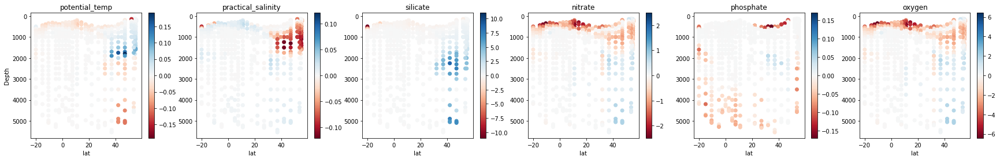

Iteration 1


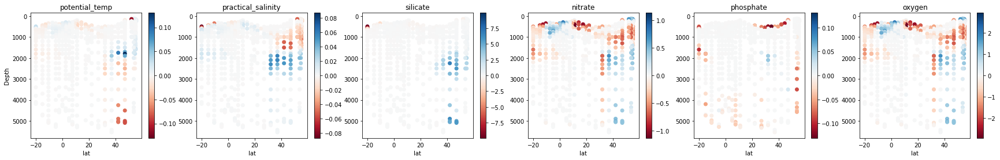

Iteration 2


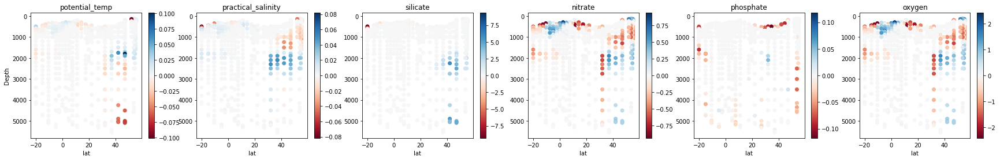

Iteration 3


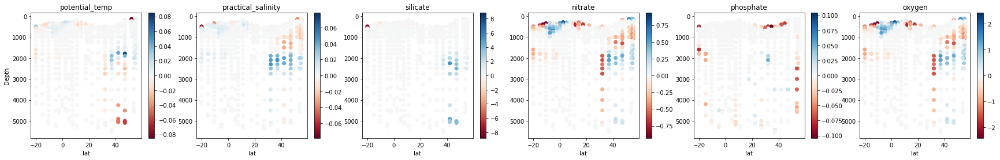

Iteration 4


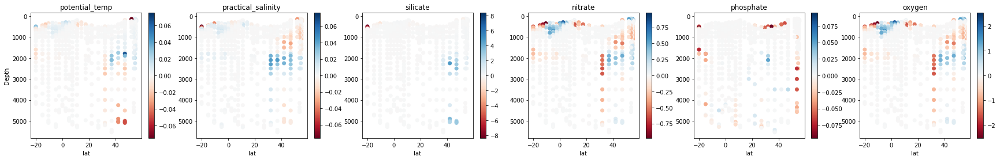

Iteration 5


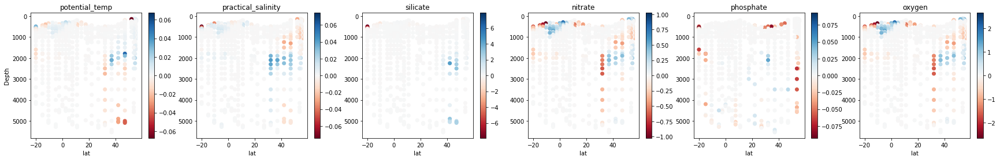

Iteration 6


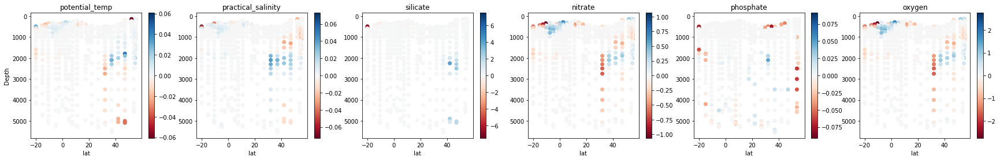

Iteration 7


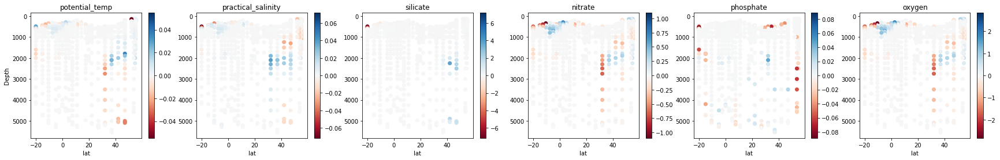

Iteration 8


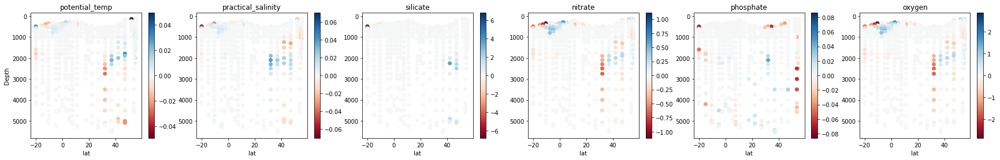

Iteration 9


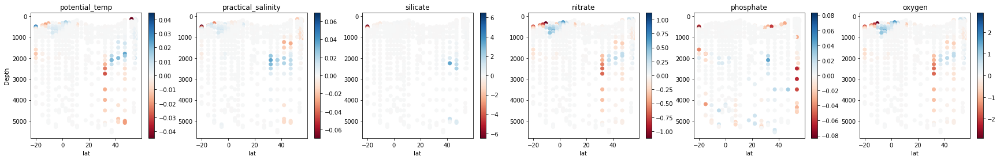

Iteration 10


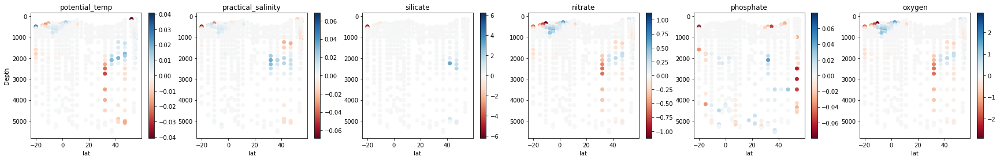

Iteration 0


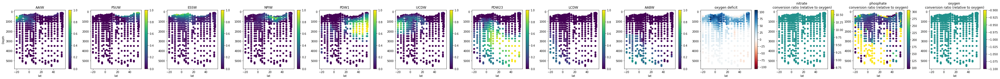

Iteration 1


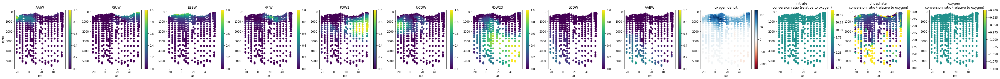

Iteration 2


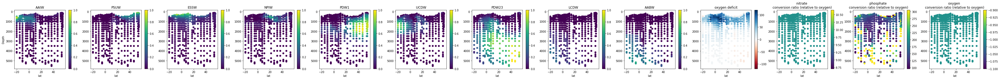

Iteration 3


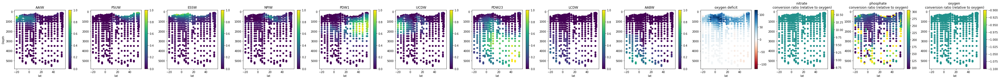

Iteration 4


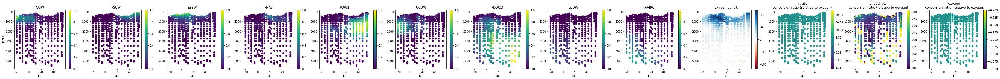

Iteration 5


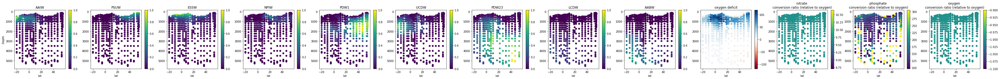

Iteration 6


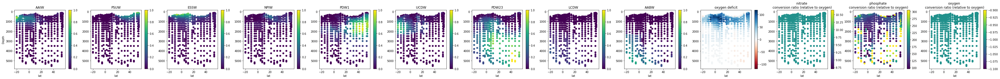

Iteration 7


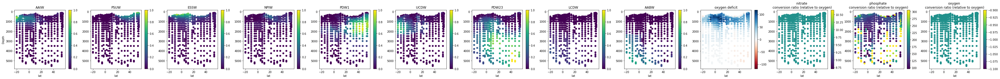

Iteration 8


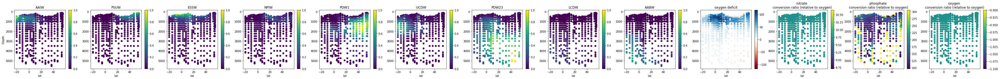

Iteration 9


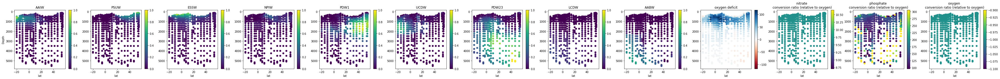

Iteration 10


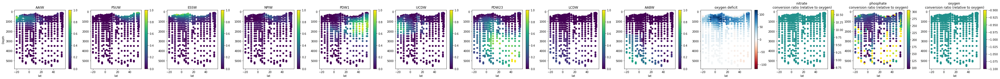

In [12]:
for iteridx, ompa_soln in enumerate(ompa_solns):
    print("Iteration",iteridx)
    plot_ompasoln_residuals(ompa_soln=ompa_soln,
                            xaxis_colname="lat",
                            yaxis_colname="Depth")

for iteridx, ompa_soln in enumerate(ompa_solns):
    print("Iteration",iteridx)
    plot_ompasoln_endmember_fractions(ompa_soln=ompa_soln,
                        xaxis_colname="lat",
                        yaxis_colname="Depth")

In [13]:
from pyompa import build_altair_viz

#Build an interactive visualization
build_altair_viz(ompa_setting_to_soln[
  ('intermediateanddeep_withpenalty_flexibleconversion',
   None, 'rian_weighting_withconversion')],
   xaxis_colname="lat", yaxis_colname="Depth")

alt.VConcatChart(...)

Thermocline Analysis

In [14]:
#Thermocline files include endmembers in the range of potential density 22 to 28 
#the Thomson and Krassovski (2010) definition of PSUW (better performing in previous version of the model) could not have its thermocline potnetial density range expanded
#likely due to lack of observation in the lower potential density range 
#the Tomczak and Godfrey (2003) definition of PSUW was used to obtain the 22-28 range 
!wget --no-check-certificate 'https://docs.google.com/uc?export=download&id=1RhhvaxDue0P6lVpNlXwdzBzQETwnsc1u' -O ENPCW_Den22to28_Oct2020_siderealPV_NO.csv
!wget --no-check-certificate 'https://docs.google.com/uc?export=download&id=1Poki02WafLnFpuc196IFOCgdQVQt_yIs' -O PSUW_Den22to28_Oct2020_siderealPV_NO.csv
!wget --no-check-certificate 'https://docs.google.com/uc?export=download&id=11cJgzVjT98Mkf_vB0gRSzCOTrEbxmz5i' -O ESSW_Den22to28_Oct2020_siderealPV_NO.csv
!wget --no-check-certificate 'https://drive.google.com/uc?export=download&id=1S9QDgIisrGRtST9EXvAMG6lO4Q1XBG3E' -O SPCW_Den22to28_Oct2020_siderealPV_NO.csv

--2021-05-17 15:51:37--  https://docs.google.com/uc?export=download&id=1RhhvaxDue0P6lVpNlXwdzBzQETwnsc1u
Resolving docs.google.com (docs.google.com)... 74.125.23.101, 74.125.23.100, 74.125.23.139, ...
Connecting to docs.google.com (docs.google.com)|74.125.23.101|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://doc-0o-a4-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/8t36b76qc67ig7ag4dh35ldbln1sorf4/1621266675000/06203730782251856755/*/1RhhvaxDue0P6lVpNlXwdzBzQETwnsc1u?e=download [following]
--2021-05-17 15:51:37--  https://doc-0o-a4-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/8t36b76qc67ig7ag4dh35ldbln1sorf4/1621266675000/06203730782251856755/*/1RhhvaxDue0P6lVpNlXwdzBzQETwnsc1u?e=download
Resolving doc-0o-a4-docs.googleusercontent.com (doc-0o-a4-docs.googleusercontent.com)... 74.125.204.132, 2404:6800:4008:c04::84
Connecting to doc-0o-a4-docs.googleusercontent.com (doc-0o-a4-docs.

In [15]:
print("First ten rows")
!head "PSUW_Den22to28_Oct2020_siderealPV_NO.csv"
print("last ten rows")
!tail "PSUW_Den22to28_Oct2020_siderealPV_NO.csv"

First ten rows
22,64.431,42.697,6.2569,85.31,54.442,4.7607,804.22,-68.018,18.211,9.9471e-08,716.82,-72.15,-80.999,64.427
22.01,63.657,42.508,10.37,84.011,53.425,4.6727,793.96,-66.984,17.912,9.7867e-08,708.26,-69.988,-82.148,63.652
22.02,62.89,42.322,14.441,82.725,52.42,4.5856,783.83,-65.959,17.616,9.628e-08,699.8,-67.85,-83.283,62.886
22.03,62.132,42.138,18.47,81.453,51.426,4.4996,773.81,-64.944,17.323,9.4709e-08,691.44,-65.734,-84.407,62.127
22.04,61.381,41.956,22.456,80.195,50.444,4.4145,763.91,-63.939,17.034,9.3154e-08,683.17,-63.642,-85.517,61.377
22.05,60.638,41.776,26.401,78.951,49.472,4.3305,754.13,-62.943,16.747,9.1616e-08,675,-61.573,-86.615,60.634
22.06,59.903,41.598,30.303,77.72,48.513,4.2474,744.47,-61.957,16.464,9.0094e-08,666.93,-59.526,-87.701,59.899
22.07,59.175,41.422,34.164,76.503,47.564,4.1654,734.93,-60.981,16.183,8.8589e-08,658.95,-57.502,-88.775,59.171
22.08,58.455,41.248,37.984,75.3,46.626,4.0843,725.5,-60.014,15.906,8.7099e-08,651.07,-55.501,-89.836,58.451
22.09

In [16]:

def read_in_thermocline_endmemberdfs(endmemname_to_csv):
    #This function reads in the data frames for the thermocline end members
    #It takes endmemname_to_csv as input, which maps the thermocline
    # end member name (e.g. ENPCW) to the corresponding csv file.
    endmemname_to_df = {}
    #iterate through every endmemname in endmemname_to_csv
    #Order of thermocline endmember file columns: Sig0 pt SP O Si N P PO Pres spic0 vor NO Lat Lon T]);
    #e.g.
    header = ["c"+str(i) for i in range(1,17)] 
    header[0] = "sigma0" #potential density 
    header[1] = "potential_temp"
    header[2] = "practical_salinity"
    header[3] = "oxygen"
    header[4] = "silicate"
    header[5] = "nitrate"
    header[6] = "phosphate"
    header[7] = "PO" #remove if calculating this later?
    header[8] = "CTD pressure"
    header[9] = "spiciness" #spiciness
    header[10] = "PV" #potential vorticity
    header[11] = "NO" #remove if calculating this later?
    header[12] = "latitude"
    header[13] = "longitude"
    header[14] = "CTD temperature"
    #make sure header names are compatible
    # with those used in the prepare_endmember_df function defined earlier
    # for intermediate waters.
    for endmemname in endmemname_to_csv.keys():
      #get the csv file corresponding to the endmemname
      csv = endmemname_to_csv[endmemname]
      #read the csv file into a data frame df
      df = pd.read_csv(csv,names=header, na_values = -999)
      augment_df_with_PO_NO_SiO(df)
      #Also add a column to the df that just has the end member name
      # repeated for each row. This will come in handy later when
      # pairing rows from different data frames
      #df["watermassname"] = endmemname
      #store df in endmemname_to_df with the key endmemname
      endmemname_to_df[endmemname] = df; 

    return endmemname_to_df


#To read in thermocline files via a for loop, first create a dictionary that maps the
# end member name (e.g. PSUW) to the paths for the csv files that
# should be used
endmemname_to_csv = {
    "PSUW": "PSUW_Den22to28_Oct2020_siderealPV_NO.csv",
    "ENPCW": "ENPCW_Den22to28_Oct2020_siderealPV_NO.csv",
    "ESSW": "ESSW_Den22to28_Oct2020_siderealPV_NO.csv",
    "SPCW": "SPCW_Den22to28_Oct2020_siderealPV_NO.csv"
}
#Then, call a function that will run a for loop to read in
# the data frames for the thermocline endmembers.
#The function will return a dictionary that maps the
# thermocline end member to the corresponding dataframe
endmemname_to_df = read_in_thermocline_endmemberdfs(endmemname_to_csv)


In [17]:
reload(pyompa)
from pyompa import ThermoclineArrayOMPAProblem
from collections import OrderedDict

#Define thermocline
#By convention, constants are in all caps
TC_UPPER_BOUND = 26.6
TC_LOWER_BOUND = 25.5
TC_STEP = 0.01
#therm_endmem_to_use = ["PSUW","ENPCW","ESSW", "SPCW"] #thermocline water masses for analysis
# members to use in the analysis 
gp15_thermocline = gp15_df[(gp15_df["sigma0"] >= TC_LOWER_BOUND)
                            & (gp15_df["sigma0"] <= TC_UPPER_BOUND)]

rescale = 0.1 #for stabilizing the solver
withspicnoNO_thermocline_paramsandweighting = ([("potential_temp",rescale*200),
                                   ("practical_salinity",rescale*155),
                                   ("silicate",rescale*5),
                                   #("NO",10),
                                   #("PO",10),
                                   ("spiciness",rescale*10),
                                   #("PV",10),
                                   ],
    [])

withRemin_thermocline_paramsandweighting = ([("potential_temp",rescale*200),
                                   ("practical_salinity",rescale*155),
                                   ("silicate",rescale*5),
                                   #("NO",10),
                                   #("PO",10),
                                   #("spiciness",10),
                                   #("PV",10),
                                   ],
    [("nitrate", rescale*50),
     ("phosphate", rescale*50),
     ("oxygen", rescale*10)])

higherSal_thermocline_paramsandweighting = ([("potential_temp",rescale*200),
                                   ("practical_salinity",rescale*600),
                                   ("silicate",rescale*5),
                                   #("NO",10),
                                   #("PO",10),
                                   #("spiciness",10),
                                   #("PV",10),
                                   ],
    [("nitrate", rescale*50),
     ("phosphate", rescale*50),
     ("oxygen", rescale*10)])

higherSal2_thermocline_paramsandweighting = ([("potential_temp",rescale*200),
                                   ("practical_salinity",rescale*600),
                                   ("silicate",rescale*8),
                                   #("NO",10),
                                   #("PO",10),
                                   #("spiciness",10),
                                   #("PV",10),
                                   ],
    [("nitrate", rescale*50),
     ("phosphate", rescale*150),
     ("oxygen", rescale*10)])

settings_to_thermoclineomparesults = OrderedDict()

for (t_paramsandweightingname, thermocline_paramsandweighting) in [
          #('withSpic_noNO', withspicnoNO_thermocline_paramsandweighting),
          #('withRemin_noSpic', withRemin_thermocline_paramsandweighting),
          #('withRemin_noSpic_higherSal', higherSal_thermocline_paramsandweighting),
          ('withRemin_noSpic_higherSal_higherSil_higherP', higherSal2_thermocline_paramsandweighting),
          ]:
  for conversionratios, conversionratiosname in [
            #(conversionratios_static, 'staticratios'),
            (conversionratios_flexible, 'flexibleratios')]:
      print("params and weight name:", t_paramsandweightingname)
      print("conversionrationame", conversionratiosname)

      settings_to_thermoclineomparesults[
        (t_paramsandweightingname,
         conversionratiosname)] = ThermoclineArrayOMPAProblem(
             stratification_col="sigma0",
             tc_lower_bound=TC_LOWER_BOUND,
             tc_upper_bound=TC_UPPER_BOUND,
             tc_step=TC_STEP,
             obs_df=gp15_thermocline,
             paramsandweighting_conserved=thermocline_paramsandweighting[0],
             paramsandweighting_converted=thermocline_paramsandweighting[1],
             conversionratios=conversionratios,
             endmembername_to_usagepenaltyfunc={}
         ).solve(endmemname_to_df=endmemname_to_df)

params and weight name: withRemin_noSpic_higherSal_higherSil_higherP
conversionrationame flexibleratios
params to use: ['potential_temp', 'practical_salinity', 'silicate'] ['nitrate', 'phosphate', 'oxygen']
param weighting: [20.  60.   0.8  5.  15.   1. ]
Conversion ratios:
[[ 0.10330579  0.01036168 -1.        ]
 [ 0.10330579  0.00327211 -1.        ]]
status: optimal
optimal value 25.1944445480581
Original weighted sum squares: 25.19444456603436
Post fix weighted sum squared: 25.194444583093727
status: optimal
optimal value 67.79820821713575
Original weighted sum squares: 67.79820831650288
Post fix weighted sum squared: 67.79820843551258
status: optimal
optimal value 25.1944445480581
Original weighted sum squares: 25.19444456603436
Post fix weighted sum squared: 25.194444583093727
objective: 25.194444583093727
No observations for range 25.51 25.520000000000003
params to use: ['potential_temp', 'practical_salinity', 'silicate'] ['nitrate', 'phosphate', 'oxygen']
param weighting: [20.  6

Visualization of Thermocline 

Plotting endmember fractions
('withRemin_noSpic_higherSal_higherSil_higherP', 'flexibleratios')


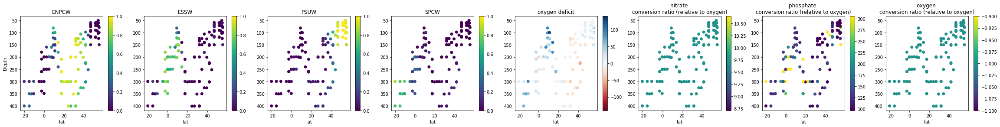

In [18]:
from pyompa import plot_thermocline_endmember_fractions

print("Plotting endmember fractions")
for setting,thermocline_ompa_results in\
  settings_to_thermoclineomparesults.items():
  print(setting)
  plot_thermocline_endmember_fractions(
      thermocline_ompa_results, xaxis_colname="lat", yaxis_colname="Depth")

Plotting parameter residuals
('withRemin_noSpic_higherSal_higherSil_higherP', 'flexibleratios')


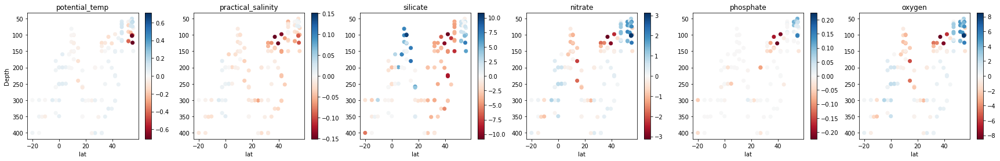

In [19]:
from pyompa import plot_thermocline_residuals

print("Plotting parameter residuals")
for setting,thermocline_ompa_results in\
  settings_to_thermoclineomparesults.items():
  print(setting)
  plot_thermocline_residuals(thermocline_ompa_results[:],
                             xaxis_colname="lat", yaxis_colname="Depth")


In [20]:
thermocline_ompa_results = settings_to_thermoclineomparesults[(
        'withRemin_noSpic_higherSal_higherSil_higherP', 'flexibleratios')]
thermocline_ompa_results.export_to_csv("thermocline_results.csv",
                        orig_cols_to_include=["lat", "lon", "Depth", "stnnbr"])

writing to thermocline_results.csv


In [21]:
from pyompa import build_thermocline_altair_viz

build_thermocline_altair_viz(
    settings_to_thermoclineomparesults[(
        'withRemin_noSpic_higherSal_higherSil_higherP', 'flexibleratios')],
    xaxis_colname="lat", yaxis_colname="Depth")

alt.VConcatChart(...)